In [1]:
import sys
from pathlib import Path
import random


import cartopy.crs as ccrs
import iris
import intake
import easygems.healpix as egh
import matplotlib.pyplot as plt
import pandas as pd
import xarray as xr

sys.path.insert(0, '/home/users/mmuetz/deploy/wcrp_hackathon/scripts/process_um_data/')
from processing_config import processing_config

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/pyproj/network.py:59: UserWarning: pyproj unable to set PROJ database path.
  _set_context_ca_bundle_path(ca_bundle_path)


In [13]:
model = 'glm.n1280_CoMA9'
config = processing_config[model]
model = 'um_' + model.replace('.', '_') + '_TBv1p2'

In [14]:
cat = intake.open_catalog('https://raw.githubusercontent.com/digital-earths-global-hackathon/catalog/refs/heads/main/UK/main.yaml')

In [15]:
list(cat)

['um_glm_n1280_GAL9',
 'um_CTC_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_SAmer_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_Africa_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_SEA_km4p4_RAL3P3_n1280_GAL9_nest',
 'um_glm_n2560_RAL3p3',
 'um_glm_n1280_CoMA9_TBv1p2']

In [17]:
ds = cat[model](zoom=9, time='PT1H').to_dask()
ds3d = cat[model](zoom=9, time='PT3H').to_dask()

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),
/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/intake_xarray/base.py:21: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  'dims': dict(self._ds.dims),


In [18]:
ds.sel(time=slice('2020-01-21 00:00')).time

<xarray.DataArray 'time' (time: 25)> Size: 200B
array(['2020-01-20T00:00:00.000000000', '2020-01-20T01:00:00.000000000',
       '2020-01-20T02:00:00.000000000', '2020-01-20T03:00:00.000000000',
       '2020-01-20T04:00:00.000000000', '2020-01-20T05:00:00.000000000',
       '2020-01-20T06:00:00.000000000', '2020-01-20T07:00:00.000000000',
       '2020-01-20T08:00:00.000000000', '2020-01-20T09:00:00.000000000',
       '2020-01-20T10:00:00.000000000', '2020-01-20T11:00:00.000000000',
       '2020-01-20T12:00:00.000000000', '2020-01-20T13:00:00.000000000',
       '2020-01-20T14:00:00.000000000', '2020-01-20T15:00:00.000000000',
       '2020-01-20T16:00:00.000000000', '2020-01-20T17:00:00.000000000',
       '2020-01-20T18:00:00.000000000', '2020-01-20T19:00:00.000000000',
       '2020-01-20T20:00:00.000000000', '2020-01-20T21:00:00.000000000',
       '2020-01-20T22:00:00.000000000', '2020-01-20T23:00:00.000000000',
       '2020-01-21T00:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
    crs      float64 8B ...
  * time     (time) datetime64[ns] 200B 2020-01-20 ... 2020-01-21

In [19]:
ds.sel(time='2021-03-01 00:00').tas.mean().compute()

<xarray.DataArray 'tas' ()> Size: 4B
array(nan, dtype=float32)
Coordinates:
    crs      float64 8B nan
    time     datetime64[ns] 8B 2021-03-01

In [35]:
cubes = iris.load('/gws/nopw/j04/kscale/DYAMOND3_data/10km-CoMA9/glm/field.pp/apvera.pp/glm.n1280_CoMA9.apvera_20200301T00.pp')

In [36]:
ctas = cubes.extract_cube('air_temperature')

In [39]:
list(ctas.coord('time').cells())

[Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 0, 4, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 1, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 2, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 3, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 4, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 5, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 6, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 7, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 8, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(2020, 3, 1, 9, 0, 0, 0, has_year_zero=False), bound=None),
 Cell(point=cftime.DatetimeGregorian(202

In [38]:
ctas[-1].data.mean()

np.float32(275.6551)

In [40]:
import xarray as xr
tas = xr.DataArray.from_iris(ctas)

/tmp/ipykernel_668/2807005439.py:2: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  tas = xr.DataArray.from_iris(ctas)


<Figure size 640x480 with 0 Axes>

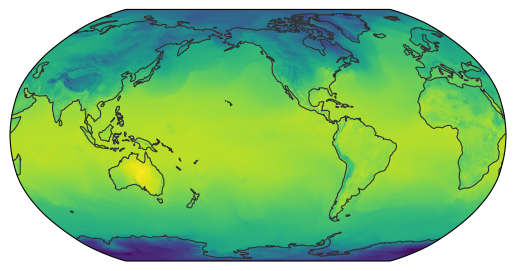

In [32]:
egh.healpix_show(ds.sel(time='2020-03-01 01:00').tas)

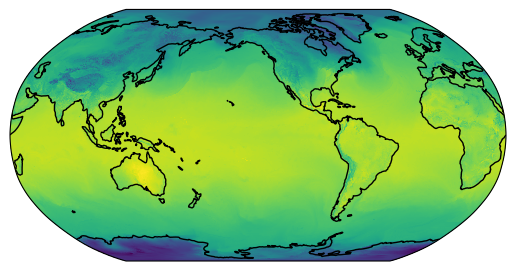

In [47]:
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.Robinson(-137)})
ax.pcolormesh(tas.longitude, tas.latitude, tas.sel(time='2020-03-01 00:04'), transform=ccrs.PlateCarree())
ax.coastlines()

In [48]:
ds

<xarray.Dataset> Size: 3TB
Dimensions:  (cell: 3145728, time: 10489)
Coordinates:
  * cell     (cell) int64 25MB 0 1 2 3 4 ... 3145724 3145725 3145726 3145727
    crs      float64 8B ...
  * time     (time) datetime64[ns] 84kB 2020-01-20 ... 2021-04-01
Data variables: (12/26)
    clivi    (time, cell) float32 132GB ...
    clt      (time, cell) float32 132GB ...
    clwvi    (time, cell) float32 132GB ...
    hflsd    (time, cell) float32 132GB ...
    hfssd    (time, cell) float32 132GB ...
    huss     (time, cell) float32 132GB ...
    ...       ...
    rsutcs   (time, cell) float32 132GB ...
    sftlf    (cell) float64 25MB ...
    tas      (time, cell) float32 132GB ...
    ts       (time, cell) float32 132GB ...
    uas      (time, cell) float32 132GB ...
    vas      (time, cell) float32 132GB ...

In [8]:
def pick_random_pp(basedir):
    pp_files = sorted(basedir.glob('*.pp'))
    return random.choice(pp_files)

In [9]:
name_map = config['groups']['2d']['name_map']

In [10]:
def pick_random_cube(pp_file):
    cubes = iris.load(pp_file)
    while True:
        try:
            name = random.choice(list(name_map))
            return cubes.extract_cube(name)
        except iris.exceptions.ConstraintMismatchError:
            continue

In [11]:
cube = pick_random_cube(pick_random_pp(Path('/gws/nopw/j04/kscale/DYAMOND3_data/5km-RAL3/glm/field.pp/apvera.pp')))

In [12]:
short_name = name_map[cube.name()]

In [13]:
def pick_random_time(da):
    return da.isel(time=random.randint(0, da.shape[0]))

In [14]:
da = xr.DataArray.from_iris(cube)
da = pick_random_time(da)

/tmp/ipykernel_624/2737988752.py:1: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


In [15]:
da.time

<xarray.DataArray 'time' ()> Size: 8B
array('2020-04-01T22:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time                     datetime64[ns] 8B 2020-04-01T22:00:00
    forecast_reference_time  datetime64[ns] 8B ...
    forecast_period          timedelta64[ns] 8B ...
Attributes:
    standard_name:  time

In [16]:
ds.sel(time=da.time, method='nearest')

<xarray.Dataset> Size: 1GB
Dimensions:                  (cell: 12582912)
Coordinates:
  * cell                     (cell) int64 101MB 0 1 2 ... 12582910 12582911
    crs                      float64 8B ...
    time                     datetime64[ns] 8B 2020-04-01T22:00:00
    forecast_reference_time  datetime64[ns] 8B ...
    forecast_period          timedelta64[ns] 8B ...
Data variables: (12/24)
    clivi                    (cell) float32 50MB ...
    clt                      (cell) float32 50MB ...
    clwvi                    (cell) float32 50MB ...
    hflsd                    (cell) float32 50MB ...
    hfssd                    (cell) float32 50MB ...
    huss                     (cell) float32 50MB ...
    ...                       ...
    rsut                     (cell) float32 50MB ...
    rsutcs                   (cell) float32 50MB ...
    tas                      (cell) float32 50MB ...
    ts                       (cell) float32 50MB ...
    uas                      (cell) float32 50MB ...
    vas                      (cell) float32 50MB ...
Attributes:
    Met Office DYAMOND3 simulations:  A group of experiments have been conduc...
    bounds:                           {'lower_left_lat': -90, 'lower_left_lon...
    latitiude_convention:             [-90, 90]
    longitude_convention:             [0, 360]
    regional:                         False
    simulation:                       glm.n2560_RAL3p3
    simulation_description:           The MetUM uses a regular lat-lon grid, ...

In [19]:
def compare_random_fields(ds):
    cube = pick_random_cube(pick_random_pp(Path('/gws/nopw/j04/kscale/DYAMOND3_data/5km-RAL3/glm/field.pp/apvera.pp')))
    short_name = name_map[cube.name()][1]
    da = xr.DataArray.from_iris(cube)
    da1 = pick_random_time(da)
    da2 = ds[short_name].sel(time=da1.time, method='nearest')
    fig, (ax0, ax1) = plt.subplots(2, 1, subplot_kw={'projection': ccrs.Robinson(-137)})
    fig.suptitle(f'{cube.name()}: {short_name} @ {pd.Timestamp(da1.time.values)}')
    #ax0.pcolormesh(da1.longitude, da1.latitude, da1, transform=ccrs.PlateCarree(), vmin=da1.values.min(), vmax=da1.values.max())
    ax0.imshow(da1, origin='lower', transform=ccrs.PlateCarree(), vmin=da1.values.min(), vmax=da1.values.max(), extent=[0, 360, -90, 90])
    ax0.coastlines()
    ax1.set_global()
    egh.healpix_show(da2, ax=ax1, vmin=da1.values.min(), vmax=da1.values.max())
    ax1.coastlines()
                     
    

/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


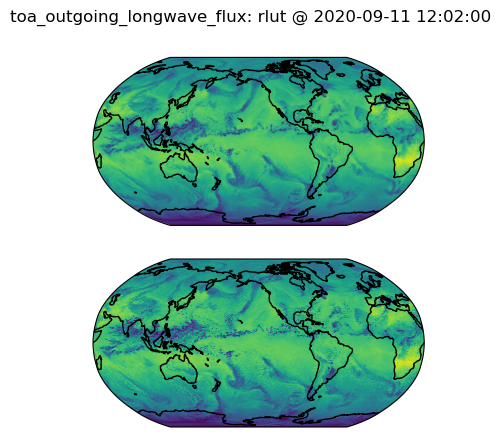

In [20]:
compare_random_fields(ds)

/tmp/ipykernel_567/1885094650.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)
/tmp/ipykernel_567/1885094650.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


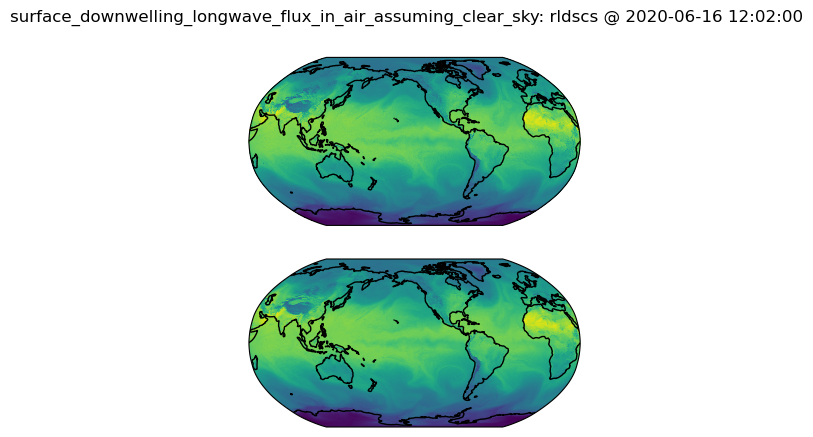

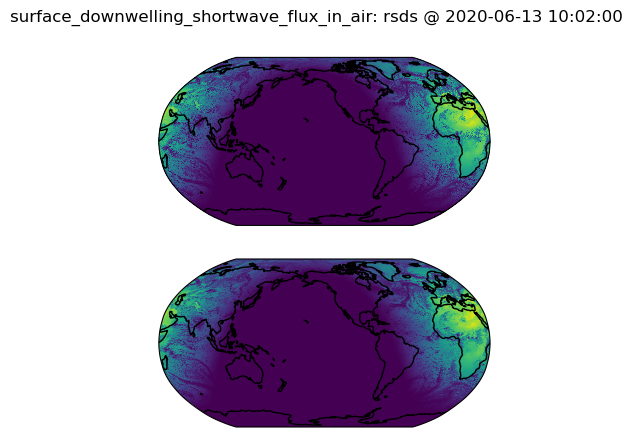

In [74]:
for i in range(2):
    compare_random_fields(ds)

/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


503, message='Service Unavailable', url='http://hackathon-o.s3.jc.rl.ac.uk/sim-data/dev/v5/glm.n2560_RAL3p3/um.PT1H.hp_z10.zarr/rlutcs/9048.7'


/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


1


/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


Index 12 is out of bounds for axis 0 with size 12


/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


2


/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


3


/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


4


/tmp/ipykernel_624/1700016383.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


5


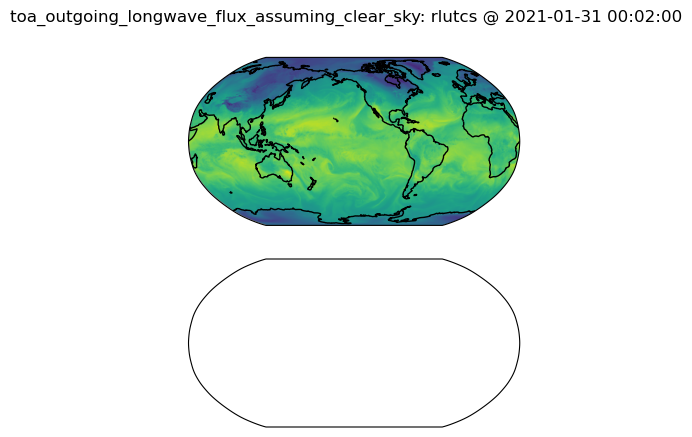

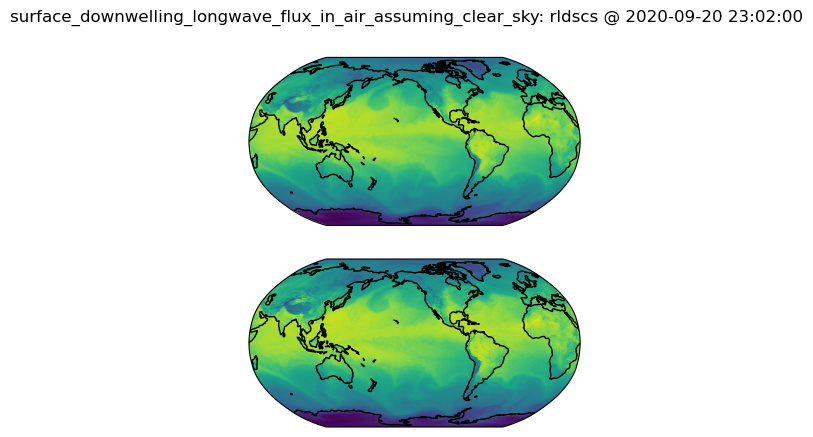

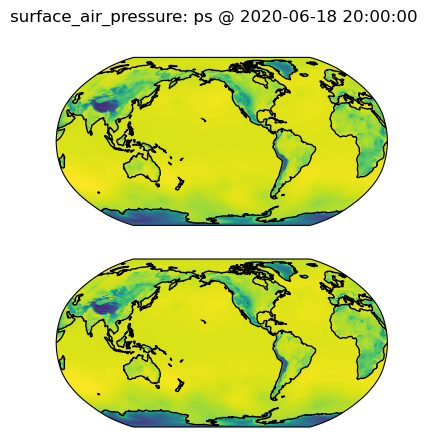

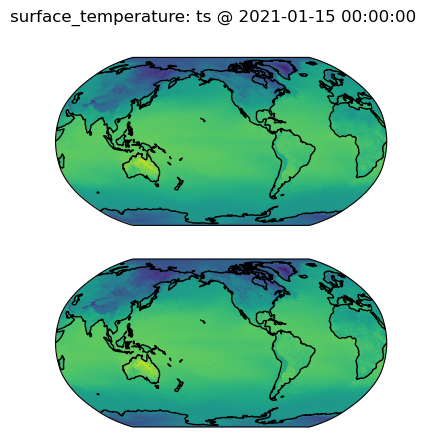

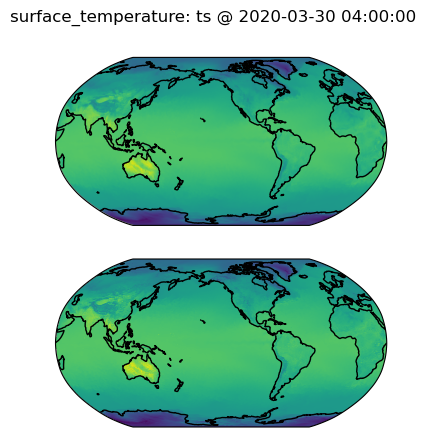

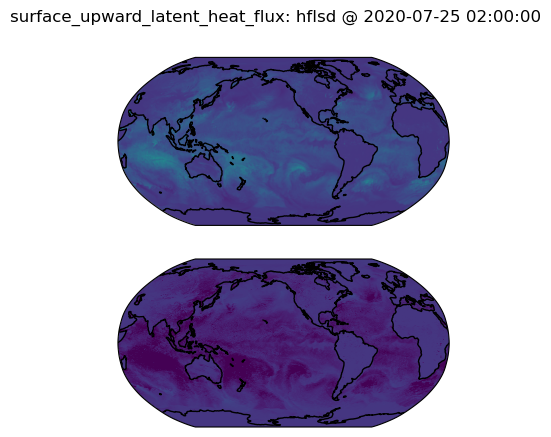

In [21]:
n = 0
while n < 5:
    try:
        compare_random_fields(ds)
        n += 1
        print(n)
    except Exception as e:
        print(e)

<Figure size 640x480 with 0 Axes>

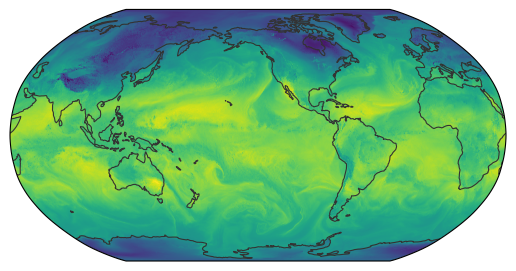

In [23]:
egh.healpix_show(ds.rlutcs.sel(time='2021-01-31 00:00'))

In [54]:
name_map_3d = config['groups']['3d']['name_map']

In [51]:
def get_pp_as_da(time, field):
    time = pd.Timestamp(time)
    start = pd.Timestamp(time.year, time.month, time.day)
    if time.hour >= 12:
        start += pd.Timedelta(hours=12)
    start_fmt = start.strftime('%Y%m%dT%H')
    path = Path('/gws/nopw/j04/kscale/DYAMOND3_data/5km-RAL3/glm/field.pp/apvera.pp') / f'glm.n2560_RAL3p3.apvera_{start_fmt}.pp'
    cubes = iris.load(path)
    cube = cubes.extract_cube(field)
    da = xr.DataArray.from_iris(cube)
    return da.sel(time=time, method='nearest')

def get_pp_as_da_3d(time, field):
    time = pd.Timestamp(time)
    start = pd.Timestamp(time.year, time.month, time.day)
    if time.hour >= 12:
        start += pd.Timedelta(hours=12)
    start_fmt = start.strftime('%Y%m%dT%H')
    path = Path('/gws/nopw/j04/kscale/DYAMOND3_data/5km-RAL3/glm/field.pp/apverc.pp') / f'glm.n2560_RAL3p3.apverc_{start_fmt}.pp'
    cubes = iris.load(path)
    cube = cubes.extract_cube(field)
    da = xr.DataArray.from_iris(cube)
    return da.sel(time=time, method='nearest')
        

In [34]:
da = get_pp_as_da('2020-06-21 21:00', list(name_map)[1])

/tmp/ipykernel_624/1925144999.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


In [102]:
def plot_pp_da_hp_da(ds, time, field):
    da1 = get_pp_as_da(time, field)
    da2 = ds[name_map[field][1]].sel(time=time, method='nearest')
    title = f'{da1.name}: {da2.name} @ {pd.Timestamp(da1.time.values)}'
    fig, (ax0, ax1) = plt.subplots(2, 1, subplot_kw={'projection': ccrs.Robinson(-137)})
    fig.suptitle(title)
    ax0.imshow(da1, origin='lower', transform=ccrs.PlateCarree(), vmin=da1.values.min(), vmax=da1.values.max(), extent=[0, 360, -90, 90])
    ax0.coastlines()
    ax1.set_global()
    egh.healpix_show(da2, ax=ax1, vmin=da1.values.min(), vmax=da1.values.max())
    ax1.coastlines()

def plot_pp_da_hp_da_3d(ds, time, field, pressure=None):
    da1 = get_pp_as_da_3d(time, field)
    da2 = ds[name_map_3d[field][1]].sel(time=time, method='nearest')
    da1 = da1.sel(pressure=pressure)
    da2 = da2.sel(pressure=pressure)
    vmin, vmax = np.percentile(da1.values.flatten(), [10, 90])
    title = f'{da1.name}: {da2.name} @ {pd.Timestamp(da1.time.values)}, {pressure} hPa'
    fig, (ax0, ax1) = plt.subplots(2, 1, subplot_kw={'projection': ccrs.Robinson(-137)}, figsize=(20, 20), layout='constrained')
    fig.suptitle(title)
    ax0.imshow(da1, origin='lower', transform=ccrs.PlateCarree(), vmin=vmin, vmax=vmax, extent=[0, 360, -90, 90])
    ax0.coastlines()
    ax1.set_global()
    egh.healpix_show(da2, ax=ax1, vmin=vmin, vmax=vmax)
    ax1.coastlines()

/tmp/ipykernel_624/1925144999.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


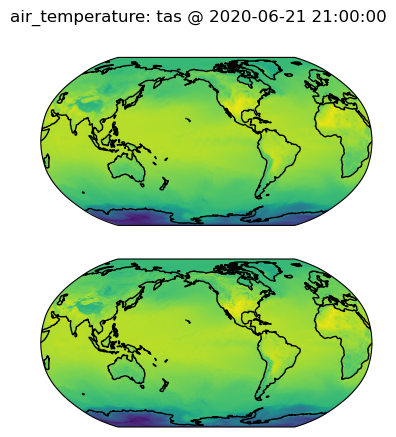

In [50]:
plot_pp_da_hp_da(ds, '2020-06-21 21:00', list(name_map)[1])

In [44]:
name_map['toa_outgoing_longwave_flux_assuming_clear_sky']

('toa_outgoing_longwave_flux_clear_sky', 'rlutcs')

/tmp/ipykernel_624/1925144999.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


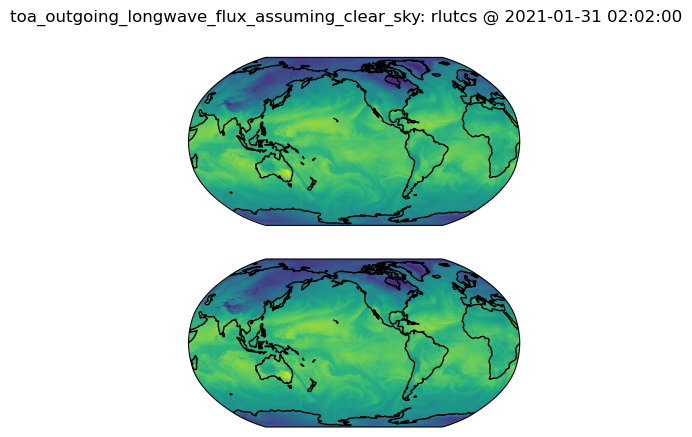

In [48]:
plot_pp_da_hp_da(ds, '2021-01-31 02:00', 'toa_outgoing_longwave_flux_assuming_clear_sky')

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


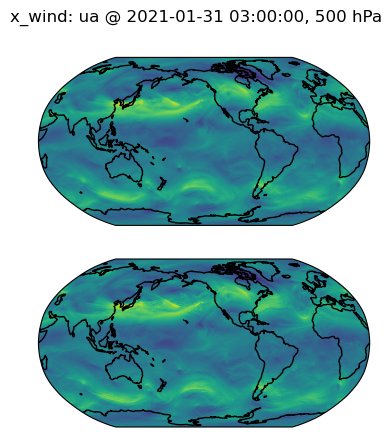

In [61]:
plot_pp_da_hp_da_3d(ds3d, '2021-01-31 02:00', 'x_wind', 500)

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


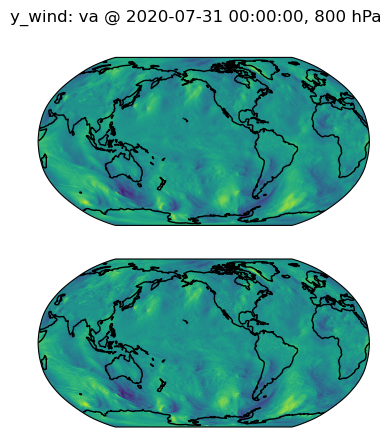

In [63]:
plot_pp_da_hp_da_3d(ds3d, '2020-07-30 23:00', 'y_wind', 800)

specific_humidity 2021-03-14T06:00:00.000000000 750
One or more of the files specified did not exist:
    * "/gws/nopw/j04/kscale/DYAMOND3_data/5km-RAL3/glm/field.pp/apverc.pp/glm.n2560_RAL3p3.apverc_20210314T00.pp" didn't match any files
specific_humidity 2021-01-24T09:00:00.000000000 1000


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


specific_humidity 2020-06-09T00:00:00.000000000 50


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


relative_humidity 2020-10-02T06:00:00.000000000 30


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


upward_air_velocity 2020-05-11T06:00:00.000000000 1000


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


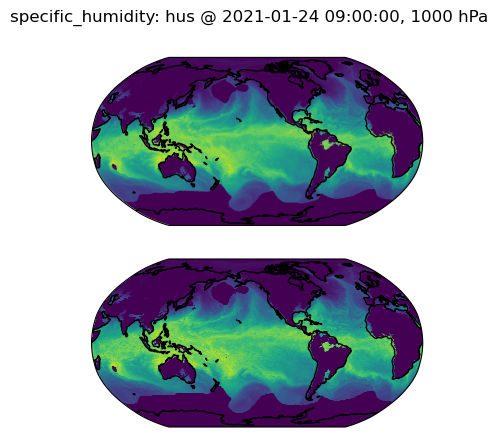

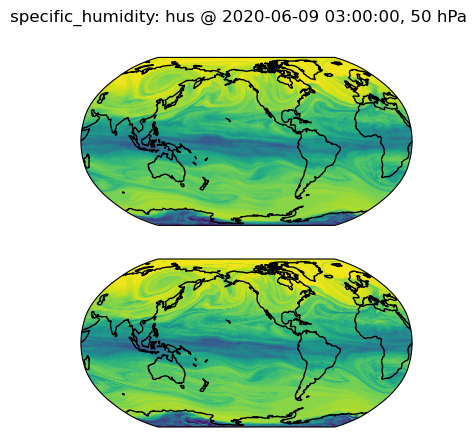

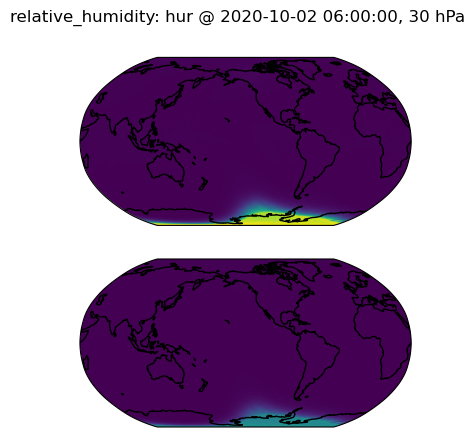

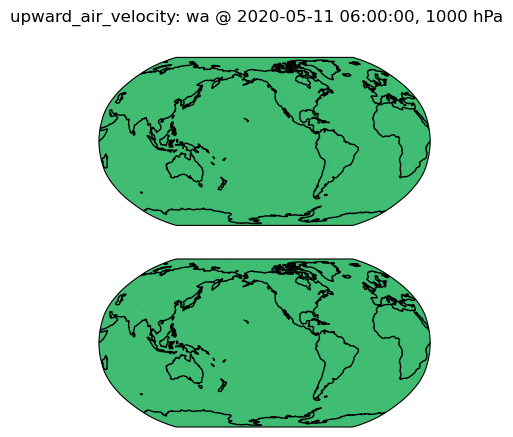

In [71]:
k = 5
for n, t, p in zip(random.choices(list(name_map_3d), k=k), random.choices(ds3d.time.values, k=k), random.choices(ds3d.pressure.values, k=k)):
    try:
        print(n, t, p)
        plot_pp_da_hp_da_3d(ds3d, t, n, p)
    except Exception as e:
        print(e)

x_wind 2020-09-12T03:00:00.000000000 10


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


air_temperature 2020-07-15T12:00:00.000000000 50


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(


Got 0 cubes for constraint Constraint(name='air_temperature'), expecting 1.
specific_humidity 2020-06-11T18:00:00.000000000 925


/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


specific_humidity 2021-01-14T09:00:00.000000000 925


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


relative_humidity 2020-05-15T09:00:00.000000000 975


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


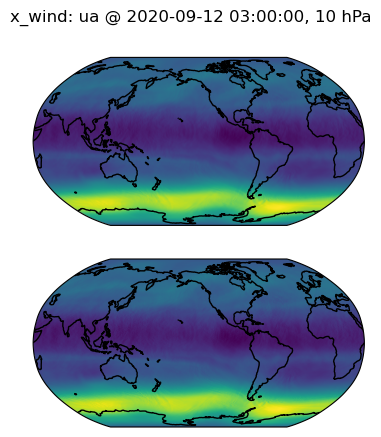

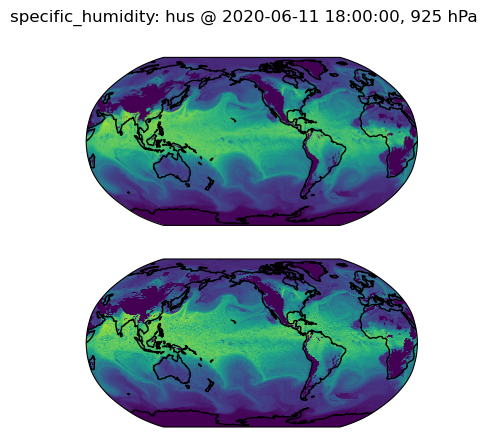

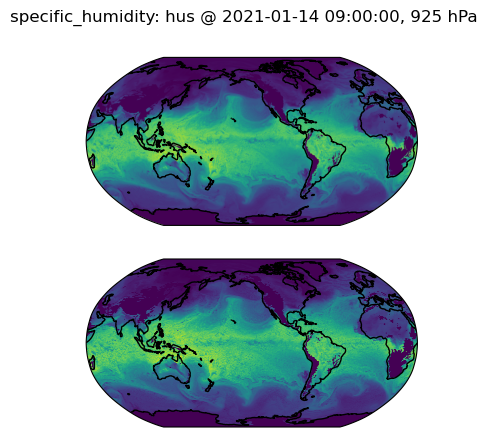

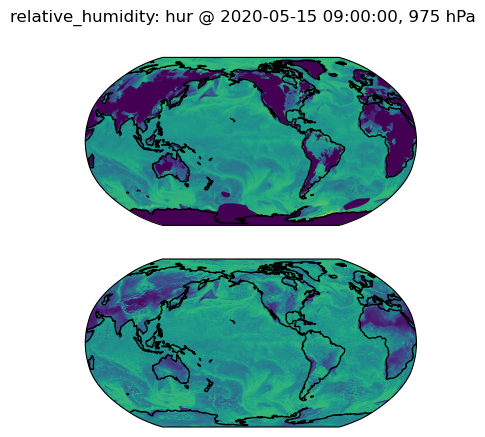

In [72]:
k = 5
for n, t, p in zip(random.choices(list(name_map_3d), k=k), random.choices(ds3d.time.values, k=k), random.choices(ds3d.pressure.values, k=k)):
    try:
        print(n, t, p)
        plot_pp_da_hp_da_3d(ds3d, t, n, p)
    except Exception as e:
        print(e)

x_wind 2021-02-12T09:00:00.000000000 500


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


specific_humidity 2020-09-14T18:00:00.000000000 800


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


upward_air_velocity 2020-12-29T09:00:00.000000000 5


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


x_wind 2020-02-20T00:00:00.000000000 1


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


y_wind 2020-11-12T21:00:00.000000000 30


/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


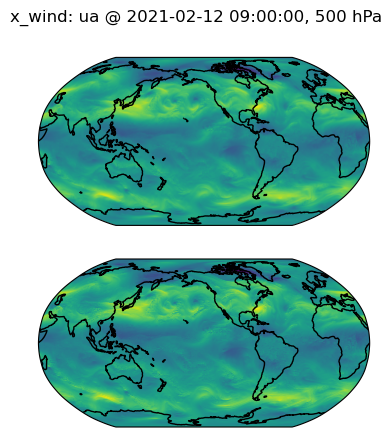

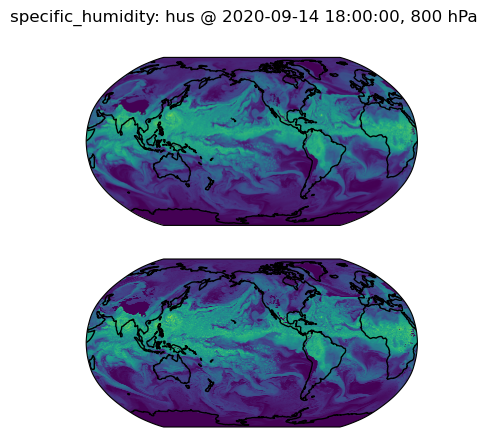

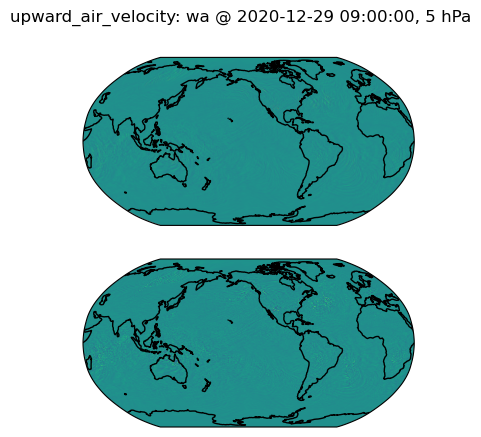

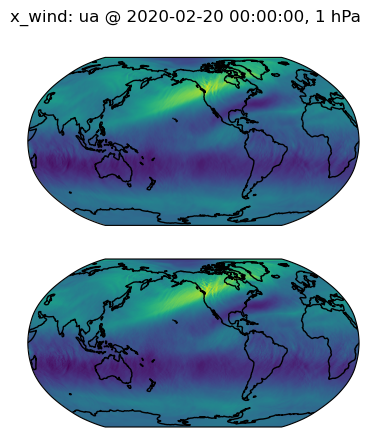

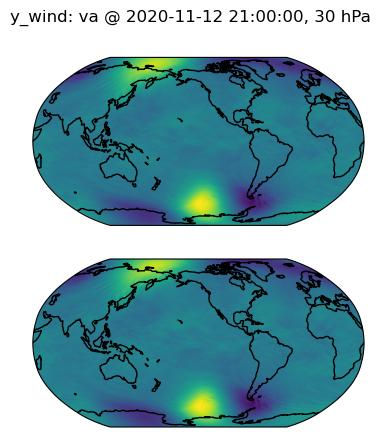

In [73]:
k = 5
for n, t, p in zip(random.choices(list(name_map_3d), k=k), random.choices(ds3d.time.values, k=k), random.choices(ds3d.pressure.values, k=k)):
    try:
        print(n, t, p)
        plot_pp_da_hp_da_3d(ds3d, t, n, p)
    except Exception as e:
        print(e)

surface_temperature 2020-02-27T22:00:00.000000000


/tmp/ipykernel_624/1270176933.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


surface_temperature 2020-06-11T14:00:00.000000000


/tmp/ipykernel_624/1270176933.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


air_pressure_at_sea_level 2021-02-09T11:00:00.000000000
Got 0 cubes for constraint Constraint(name='air_pressure_at_sea_level'), expecting 1.
toa_outgoing_shortwave_flux 2020-04-09T23:00:00.000000000
Got 2 cubes for constraint Constraint(name='toa_outgoing_shortwave_flux'), expecting 1.
atmosphere_cloud_liquid_water_content 2020-02-03T02:00:00.000000000
Got 0 cubes for constraint Constraint(name='atmosphere_cloud_liquid_water_content'), expecting 1.


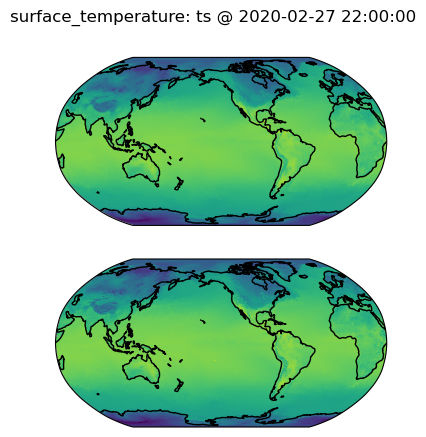

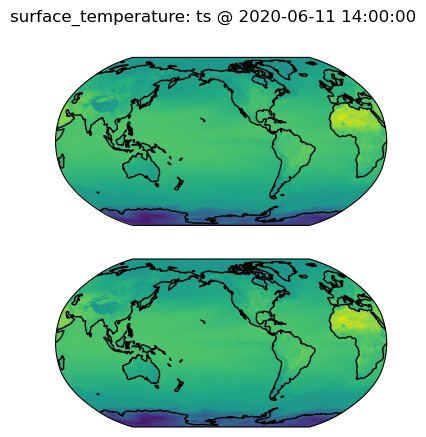

In [74]:
k = 5
for n, t in zip(random.choices(list(name_map), k=k), random.choices(ds.time.values, k=k)):
    try:
        print(n, t)
        plot_pp_da_hp_da(ds, t, n)
    except Exception as e:
        print(e)

surface_downwelling_longwave_flux_in_air_assuming_clear_sky 2020-06-14T18:00:00.000000000


/tmp/ipykernel_624/1270176933.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


surface_upward_sensible_heat_flux 2020-07-25T07:00:00.000000000


/tmp/ipykernel_624/1270176933.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


stratiform_snowfall_flux 2020-03-26T13:00:00.000000000
Got 0 cubes for constraint Constraint(name='stratiform_snowfall_flux'), expecting 1.
stratiform_snowfall_flux 2020-07-14T03:00:00.000000000
Got 0 cubes for constraint Constraint(name='stratiform_snowfall_flux'), expecting 1.
surface_downwelling_longwave_flux_in_air_assuming_clear_sky 2020-05-14T02:00:00.000000000


/tmp/ipykernel_624/1270176933.py:10: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


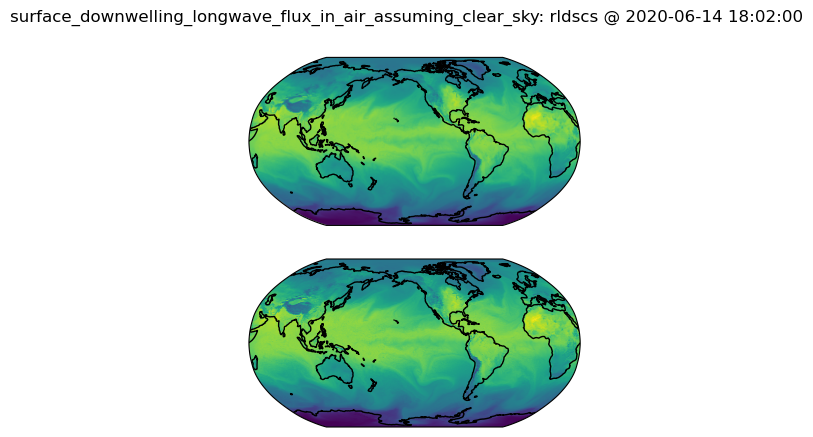

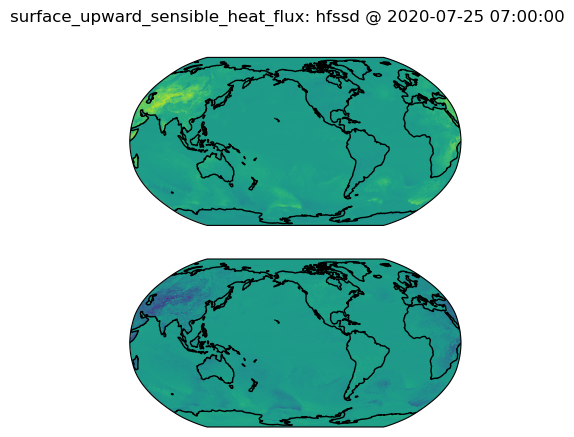

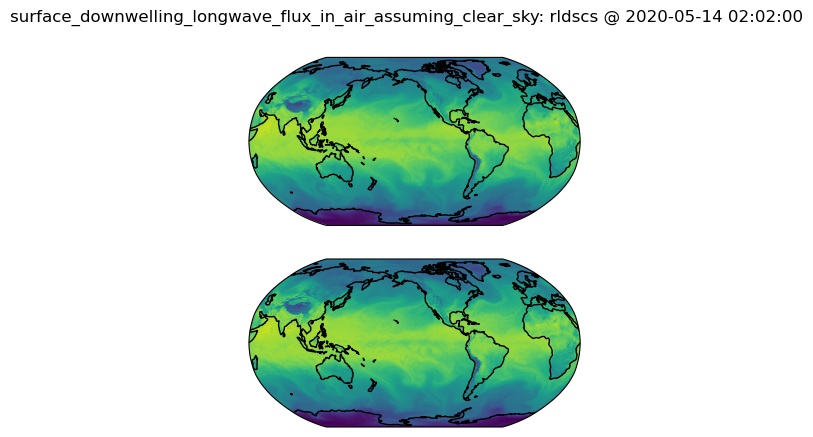

In [75]:
k = 5
for n, t in zip(random.choices(list(name_map), k=k), random.choices(ds.time.values, k=k)):
    try:
        print(n, t)
        plot_pp_da_hp_da(ds, t, n)
    except Exception as e:
        print(e)

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


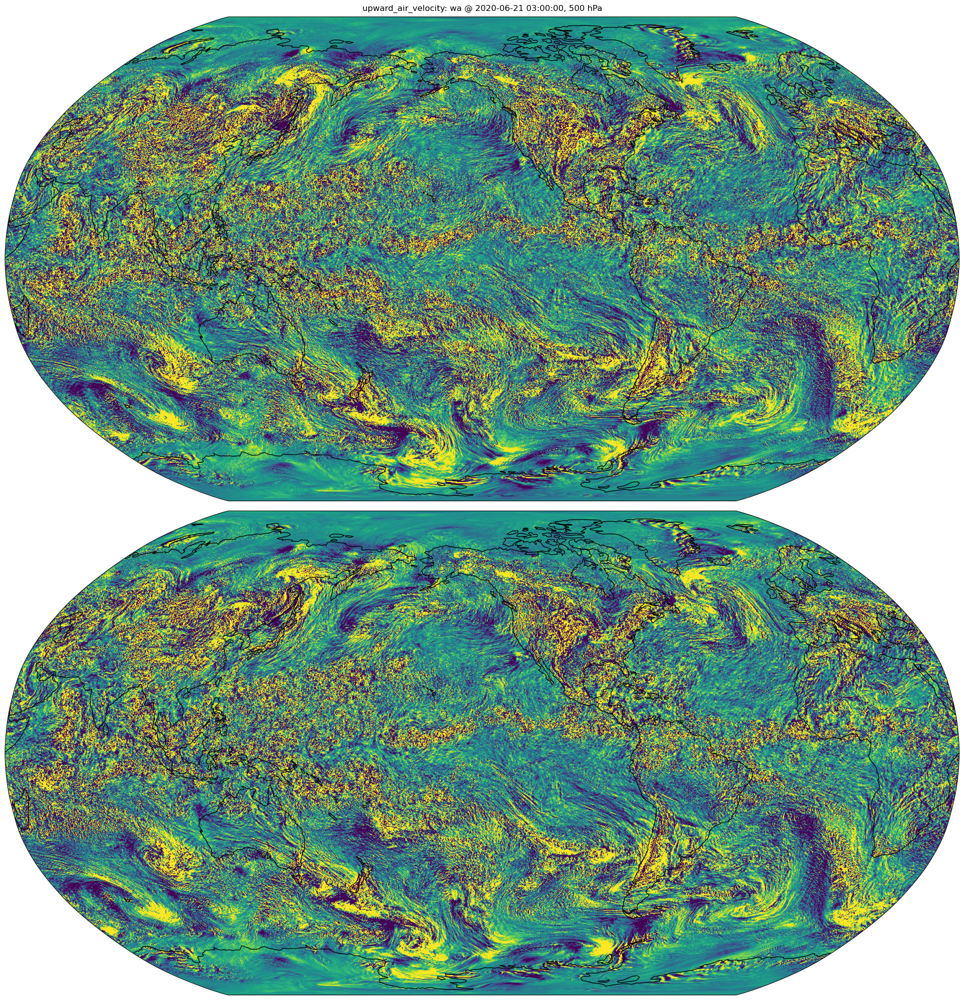

In [103]:
plot_pp_da_hp_da_3d(ds3d, '2020-06-21 00:00', 'upward_air_velocity', 500)

In [77]:
u = get_pp_as_da_3d('2020-06-21 00:00', 'upward_air_velocity')

/home/users/mmuetz/miniforge3/envs/hackathon_env/lib/python3.12/site-packages/iris/fileformats/rules.py:371: IrisUserWarning: Unable to create instance of HybridHeightFactory. The source data contains no field(s) for 'orography'.
  warnings.warn(
/tmp/ipykernel_624/1270176933.py:22: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  da = xr.DataArray.from_iris(cube)


In [82]:
u = u.compute()

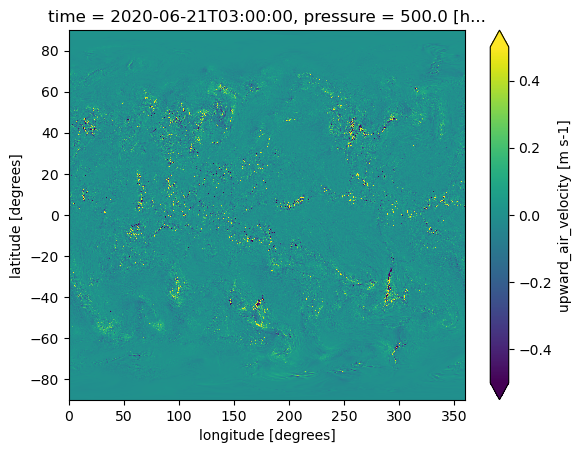

In [97]:
u.sel(pressure=500).plot(vmin=-0.5, vmax=0.5)

(array([2.390000e+02, 2.430000e+02, 2.710000e+02, 2.690000e+02,
        3.040000e+02, 3.400000e+02, 3.440000e+02, 3.110000e+02,
        4.240000e+02, 3.960000e+02, 4.390000e+02, 4.570000e+02,
        5.400000e+02, 5.420000e+02, 5.940000e+02, 6.880000e+02,
        7.380000e+02, 8.040000e+02, 9.030000e+02, 9.930000e+02,
        1.135000e+03, 1.156000e+03, 1.265000e+03, 1.459000e+03,
        1.658000e+03, 1.965000e+03, 2.024000e+03, 2.278000e+03,
        2.553000e+03, 3.230000e+03, 3.405000e+03, 3.918000e+03,
        4.680000e+03, 6.028000e+03, 6.605000e+03, 8.064000e+03,
        9.912000e+03, 1.376300e+04, 1.613000e+04, 2.095800e+04,
        2.820800e+04, 4.518900e+04, 6.131300e+04, 9.546900e+04,
        1.570020e+05, 3.137540e+05, 5.550710e+05, 1.143204e+06,
        2.394998e+06, 5.510947e+06, 5.304894e+06, 1.796046e+06,
        8.456080e+05, 4.373230e+05, 2.651960e+05, 1.457990e+05,
        9.622600e+04, 6.631200e+04, 5.146000e+04, 3.432700e+04,
        2.658600e+04, 2.089800e+04, 1.81

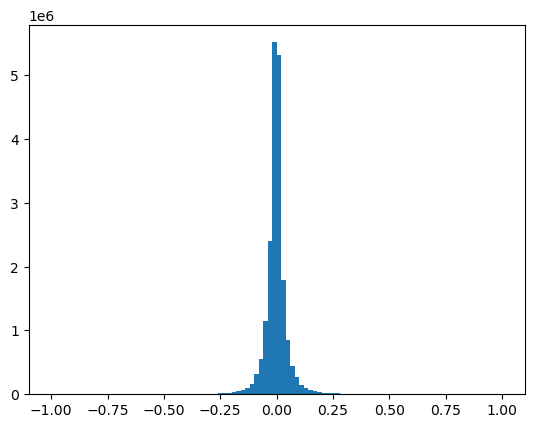

In [96]:
#import numpy as np
plt.hist(u.sel(pressure=500).values.flatten(), bins=np.linspace(-1, 1, 101))
